# Visualizing the Sizes of Mountains

##### Techniques used in this notebook:
- Creating a color map in Matplotlib
- Finite Differences to compute a surface gradient
- Calculating a surface normal vector





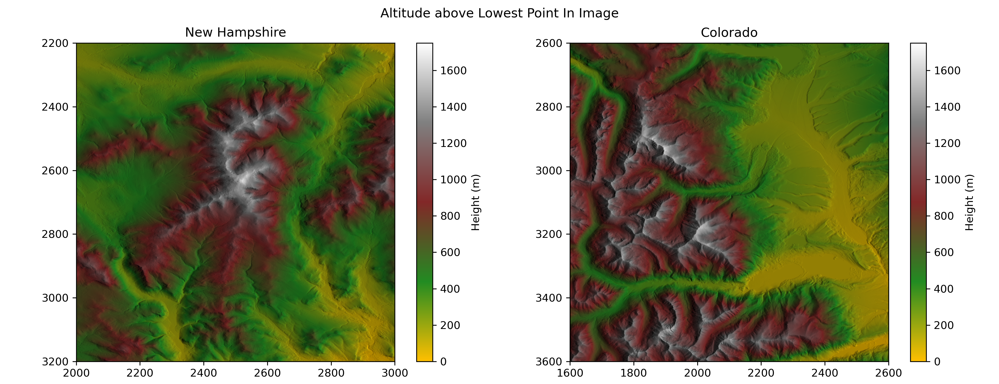

In [1]:
from IPython.display import Image
Image(filename='NH_CO_mountains.png') 

#### How tall is a mountain? 

This question is either very easy to answer, or very difficult. The typical answer is that the height of the mountain is the altitude above sea level. While this is a perfectly valid response, it often doesn't map to our intuition about what the height is, because the local terrain around one mountain may be much higher than another. For example, Mount Elbert, CO and Mount Rainier, WA are nearly identical in summit altitude, but if you've seen both, you probably felt that Rainier was a far bigger and more impressive mountain. 

Our intuition about the size of mountains is less about the height above sea level than it is the relative height above the surrounding terrain. There are many ways to quantify the relative height of mountains, each with advantages and disadvantages. Topographic prominence is a common metric, which gives Rainier a prominence of over 13,000' to Elbert's 9,000'. However topographic prominence really measures how independent a peak is compared to another mountain, and quickly yields silly results if we try to use it as a measure of height. Mount Massive, next door to Mount Elbert, is just 12' lower above sea level, but it's topographic prominence is a mere 2,000'; this difference is because if we were to do a ridgewalk from Massive to Elbert, with the correct route we would only need to dip 2,000' below Massive's summit.

Rather than attempt a single metric that captures the true height of a mountain, I decided to simply visualize the whole landscape around the mountain, setting the 0 altitude to the minimum height visible in the plotted image. This is easily done using Python and Matplotlib, but the resulting plots are a little too basic. For fun, we can spruce them up by writing a simple algorithm to shade the image, and in the process refresh ourselves on multivariate calculus.

In this notebook, we're going to write the code to compare the relative relief of two mountainous regions, more or less from scratch. As my example cases, I'll use two of my favorite places to hike: first, the Sawatch Range in Colorado, home to the highest peaks in the Rockies, and second, the White Mountains of New Hampshire, famous for having absolutely atrocious weather. 

# 0: Load the data

In a future notebook, we'll make this less manual. For now, we can just download the tiff files directly from nationalmap.gov. 

These files make working with geographic data very easy. Each pixel represents the altitude above sea level, and they have a resolution of 1 pixel for 1 arcsecond, where one arcsecond is roughly 30.87 meters.

https://apps.nationalmap.gov/lidar-explorer/#/

In [2]:
from PIL import Image
import numpy as np
# loads the tif file, and converts it to a numpy array
def load_pix(filename):
    im = Image.open(filename)
    pix = np.array(im.getdata()).reshape(im.size[0], im.size[1], 1)
    return pix

In [3]:
pix = load_pix('USGS_1_n45w072_20190509.tif')

In [4]:
pix2 = load_pix('USGS_1_n40w107_20210312.tif')

# 1: Visualizing the Altitude Above Sea Level

For a first pass, we can just plot the whole images using imshow. This function plots each pixel with a default colormap, scaled to the roughly minimum and maximum in the image.

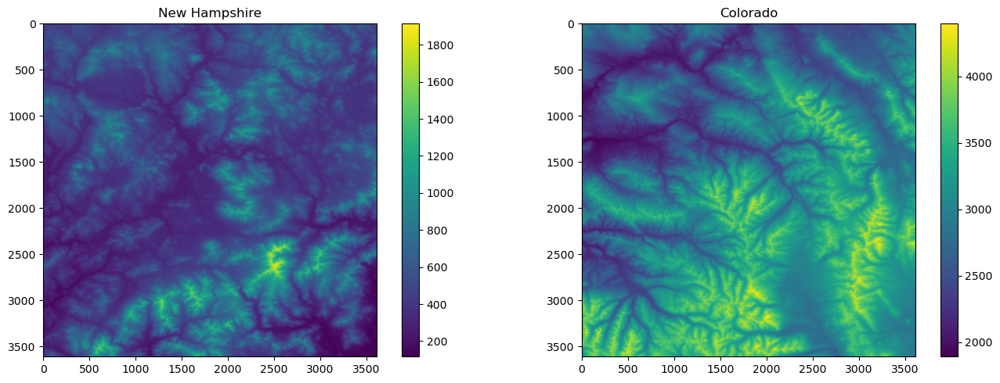

In [5]:
import matplotlib.pyplot as plt

f, ax = plt.subplots(1,2, figsize=(14,5))
f1 = ax[0].imshow(pix)
ax[0].set_title("New Hampshire")
plt.colorbar(f1)

f2 = ax[1].imshow(pix2)
ax[1].set_title("Colorado")
plt.colorbar(f2)

plt.tight_layout()

In New Hampshire, we can see the Presidential Range, including Mount Washington, stands out as a bright cluster in the lower right quadrant of the image. 

By comparison, Colorado shows a much larger extent of high mountains, with the Mosquito Range running vertically on the right hand side of the image, and the Sawatch Range in the lower central part, with a broad flat vallet in between them.

Naturally, the colorbar shows that the altitude above sea level in the Colorado Rockies is thousands of meters higher.

Let's zoom in on the Presidential Range and the Sawatch.

In [6]:
bounds_1 = (2000, 2000+1000, 3200, 3200-1000)
bounds_2 = (1600, 1600+1000, 3600, 3600-1000)

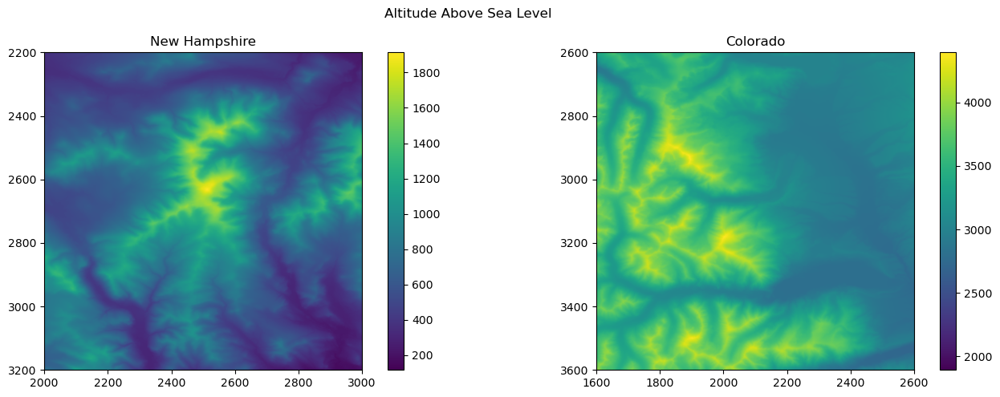

In [7]:
f, ax = plt.subplots(1,2, figsize=(14,5))
f1 = ax[0].imshow(pix)
ax[0].set_title("New Hampshire")
ax[0].set_xlim(bounds_1[0], bounds_1[1])
ax[0].set_ylim(bounds_1[2], bounds_1[3])
plt.colorbar(f1)
f2 = ax[1].imshow(pix2)
ax[1].set_title("Colorado")
ax[1].set_xlim(bounds_2[0], bounds_2[1])
ax[1].set_ylim(bounds_2[2], bounds_2[3])
plt.colorbar(f2)
plt.suptitle("Altitude Above Sea Level")
plt.tight_layout()

Mount Washington is clearly visible in the New Hampshire image, as the bright spot located centrally in the Presidential Range. Moving north along the spine of the mountains, we come to three more major peaks: Mount Jefferson, Mount Adams, and finally at the northeastern edge, Mount Madison.

In the Colorado image, there are three notable 14ers visible. The large region of high altitude above the center and to the left is Mount Massive, while just below the center is Mount Elbert, the highest mountain in the Rockies. Moving down and to the left from Mount Elbert, we find La Plata.

In the case of the Presidential Range, the top of Mount Washington appears to be roughly 1600 meters above the valley in the lower right (containing the town of North Conway). It's a bit harder to read the Colorado image, because the colorscale starts much lower than the valley, but it looks like the valley is at roughly 3000 meters, and the mountain tops are roughly 1500 meters above that. 

To make this more clear, let's customize our color scales.

# 2: Visualizing the Relative Height Above Surrounding Terrain

We'll use the same plotting bounds

In [8]:
bounds_1 = (2000, 2000+1000, 3200, 3200-1000)
bounds_2 = (1600, 1600+1000, 3600, 3600-1000)

To plot the relative height of the mountains, we'll do the following:
- The 0 for the colorbar will be the minimum altitude above sea level in the image.
- The maximum will be the same in both images, so that the color shows both image's height above the minimum point on the same scale.

In [9]:
# Restrict the images to the bounds
def get_limits(pix, pix2, bounds_1, bounds_2):
    pix_subset = pix[bounds_1[3]:bounds_1[2], bounds_1[0]:bounds_1[1]]
    pix2_subset = pix2[bounds_2[3]:bounds_2[2], bounds_2[0]:bounds_2[1]]
    vmin_1 = np.min(pix_subset)
    vmin_2 = np.min(pix2_subset)
    vmax_1 = np.max(pix_subset)
    vmax_2 = np.max(pix2_subset)
    # Get the total size of the color scale as the largest of the two images
    print("Max difference for New Hampshire ", vmax_1-vmin_1)
    print("Max difference for Colorado ", vmax_2-vmin_2)
    max_extent = max(vmax_1-vmin_1, vmax_2 - vmin_2)
    return vmin_1, vmin_2, max_extent
vmin_1, vmin_2, max_extent = get_limits(pix, pix2, bounds_1, bounds_2)

Max difference for New Hampshire  1750.0365295410156
Max difference for Colorado  1684.254150390625


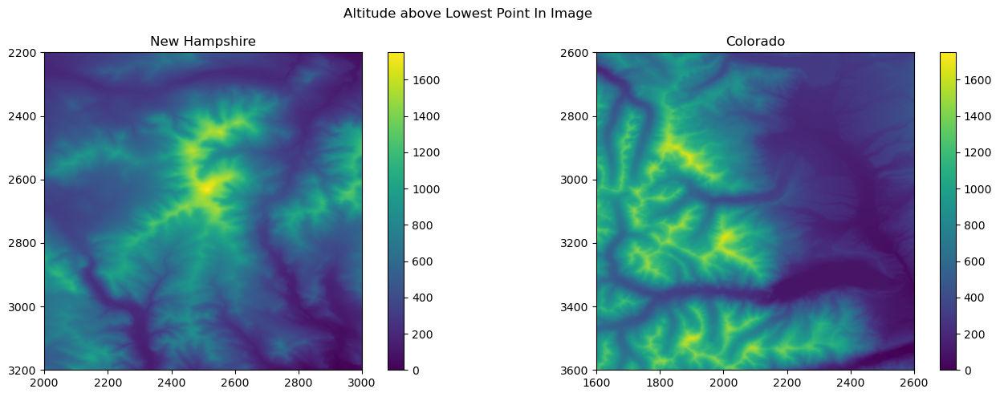

In [10]:
f, ax = plt.subplots(1,2, figsize=(14,5))
im=ax[0].imshow(pix-vmin_1, vmin=0, vmax=max_extent)
ax[0].set_xlim(bounds_1[0], bounds_1[1])
ax[0].set_ylim(bounds_1[2], bounds_1[3])
ax[0].set_title("New Hampshire")
f.colorbar(im)
im2=ax[1].imshow(pix2-vmin_2, vmin=0, vmax=max_extent)
ax[1].set_xlim(bounds_2[0], bounds_2[1])
ax[1].set_ylim(bounds_2[2], bounds_2[3])
ax[1].set_title("Colorado")
f.colorbar(im2)
plt.suptitle("Altitude above Lowest Point In Image")
plt.tight_layout()

On this new color scale, we can make some interesting (and perhaps surprising) comparisons between the two sets of mountains.

- The Colorado Mountains are much "pointier". Each ridgeline is quite sharp, and Mount Elbert in particular gains over 1600 meters in a short distance above the lakes to the southeast.
- Mount Washington is roughly the same height above the valleys as the Sawatch 14ers: ~1600 meters, or 1 mile. If you don't track your hikes with something like Garmin, this might come as a surprise to you. After all, the Rockies are much higher mountains, so it's probably unexpected that the highest of the Rockies would be similar in relative relief to something in the Appalachians. 

While the above plots are informative, they aren't visually appealing. Moreover, they aren't very easy for human brains to interpret: nothing about the color scheme intuitively conveys altitude. In the next section, we'll make our plots more attractive, from scratch.

# 3. Making Our Plots Look Better

The first step in making our plots look better is using a more intuitive color map. We want to make one that immediately suggests altitude to the viewer. 

To do this, we will simply define the major colors we want to see, and then interpolate their RGB values to create a large list of smoothly varying colors.

In [11]:
from matplotlib.colors import ListedColormap
from matplotlib import cm
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt

In [12]:
# How many colors to use in the map. 
n_colors_in_map = 1024
# Define the major colors in the map
all_colors = np.array([  [255,191,0], # Gold
                         [34,139,34], # Forest green
                         [130,40,40], # Brown
                         [128, 128, 128], # Grey
                         [255,255,255], # white
                        ]
                     )
# Matplotlib expects RGB values to be on a 0-1 scale
all_colors = all_colors/255.
# Define the "x" values that the colors correspond to in the interpolation. Since we have 5 colors, and want to have 1024, 
# this will look like 0, 256, 512, 767, 1024
target_x = np.linspace(0, n_colors_in_map, all_colors.shape[0])
# Define a function to interpolate the RGB values
frgb=[interp1d(target_x, all_colors[:,i], kind='linear') for i in range(all_colors.shape[1])]
# Evaluate the interpolated RGB values
interp_colors = [frgb[i](np.arange(0,n_colors_in_map)) for i in range(all_colors.shape[1])]
# Pack the colors into an array, and use ListedColormap to create a colormap that we can use in matplotlib
newcolors = np.zeros((n_colors_in_map, 3))
for i in range(3):
    newcolors[:,i] = interp_colors[i]
mtn_cmp = ListedColormap(newcolors)

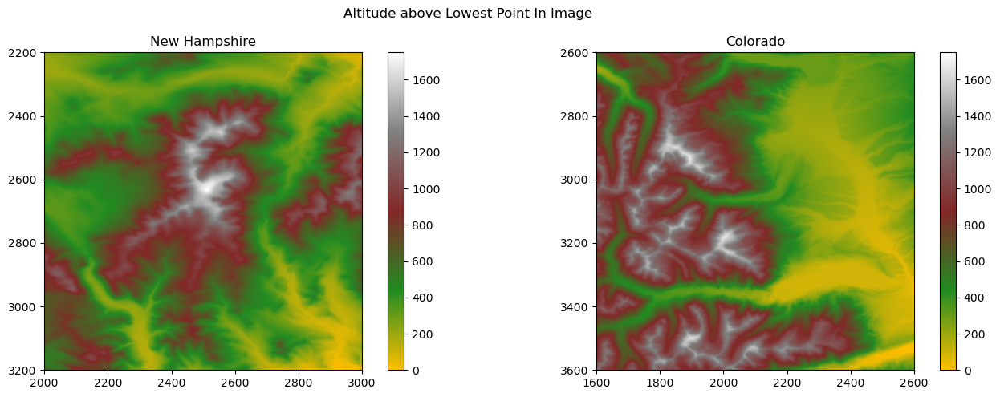

In [13]:
f, ax = plt.subplots(1,2, figsize=(14,5))
im=ax[0].imshow(pix-vmin_1, vmin=0, vmax=max_extent, cmap=mtn_cmp)
ax[0].set_xlim(bounds_1[0], bounds_1[1])
ax[0].set_ylim(bounds_1[2], bounds_1[3])
ax[0].set_title("New Hampshire")
f.colorbar(im)
im2=ax[1].imshow(pix2-vmin_2, vmin=0, vmax=max_extent, cmap=mtn_cmp)
ax[1].set_xlim(bounds_2[0], bounds_2[1])
ax[1].set_ylim(bounds_2[2], bounds_2[3])
ax[1].set_title("Colorado")
f.colorbar(im2)
plt.suptitle("Altitude above Lowest Point In Image")
plt.tight_layout()

The new colormap makes the plots more "intuitive", with mountain tops being a snow covered white, lower slopes being brown, and valleys being a mixture of green and yellow. Of course, these colors do not correspond at all to the location of the tree line and local vegetation, but they get the idea across.

While we've improved the color scale, our images are still unnecessarily hard to grasp, because they don't look like actual 3d objects. To improve this, we're going to write a very simple script to add shading. This consists of two parts:
1. Computing the gradient of the mountain slopes
2. Using the gradient to shade the image

We're going to do this entirely in matplotlib and numpy, because it's more fun that way.

## 3.1 Computing the gradient of the mountain slopes

Here's where Calculus III comes back for us.

When computing the gradient of the mountain slopes, we are measuring the steepness. Steepness is how quickly a surface rises over some distance, so this is naturally just the *derivative* of the function that defines the surface. Equivalently, the *normal vector* for the surface points more upwards if the surface is not steep, and more to the sides if it is steep. If our surface is defined by $z-f(x,y)=0$, then the normal vector is given by
$$n=(-\partial_x f, -\partial_y f, 1)$$

We don't actually have the function defining the surface, but we do have the samples, which are the height values for each pixel. So for a given pixel $(x_0,y_0)$, we have the sampled height $z_0:=f(x_0, y_0)$. Since we have samples, we can approximate the gradient *numerically*, using [finite differences](https://en.m.wikipedia.org/wiki/Finite_difference). The idea of finite differences is simple enough: interpolate the sampled values of the function $f$, and then compute the actual derivative of the interpolation. In practice, it's even easier, because the interpolated function derivatives can be computed from standard formulas.

A simple and accurate finite difference approximation is the "central difference". For a function $f(x,y)$, the central difference approximating the $x$-derivative at $(x_0, y_0)$, is given by the following formula:
$$\partial_x f(x,y)|_{x_0,y_0} \approx \frac{f(x_0+\Delta x,y_0) - f(x_0 - \Delta x,y_0)}{2\Delta x}$$


You wouldn't want to use for loops to compute all of the derivatives in Python, because it would be painfully slow to compute (go ahead and try it, I'll wait). But fortunately, we can compute the finite difference using linear algebra, for which numpy is very fast.

In [14]:
# Create the matrix to compute the central differences
a = np.ones(pix.shape[0]-1)*-1
b = np.ones(pix.shape[0])*0
c = np.ones(pix.shape[0]-1)*1
Delta =  np.diag(a, -1) + np.diag(b, 0) + np.diag(c, 1)
print(Delta)

[[ 0.  1.  0. ...  0.  0.  0.]
 [-1.  0.  1. ...  0.  0.  0.]
 [ 0. -1.  0. ...  0.  0.  0.]
 ...
 [ 0.  0.  0. ...  0.  1.  0.]
 [ 0.  0.  0. ... -1.  0.  1.]
 [ 0.  0.  0. ...  0. -1.  0.]]


The finite difference matrix Delta has to be divided by $2\Delta x$, where in our case $\Delta x$ is how many meters are in one arcsecond of the earth's surface.

In [15]:
delta = 30.87 
Delta = Delta*-1/2/delta

Putting it all together, here's our function to compute the normal vector, via the gradients, for one of our images. 

In [16]:
def get_normal_vector(pix):
    # computes the normal vector for a heightmap
    xgrad=pix.reshape(pix.shape[0],pix.shape[1])@Delta # Mutiply the finite difference matrix for the x derivative into the height map.
    ygrad=Delta@pix.reshape(pix.shape[0],pix.shape[1]) # Exercise for the reader: Why does this give us the y-gradient?
    normal_vector = (-xgrad, -ygrad, 1)
    return normal_vector
    

Let's visualize the x-gradient, which is -1 times the first element of the normal vector

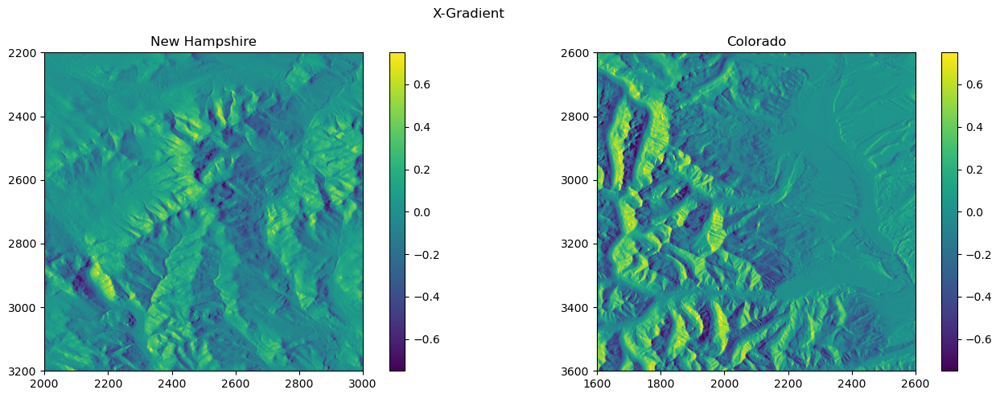

In [17]:
normal_NH = get_normal_vector(pix)
normal_CO = get_normal_vector(pix2)


f, ax = plt.subplots(1,2, figsize=(14,5))
im=ax[0].imshow(-1*normal_NH[0], vmin=-0.75, vmax=.75)
ax[0].set_xlim(bounds_1[0], bounds_1[1])
ax[0].set_ylim(bounds_1[2], bounds_1[3])
ax[0].set_title("New Hampshire")
f.colorbar(im)
im2=ax[1].imshow(-1*normal_CO[0], vmin=-0.75, vmax=.75)
ax[1].set_xlim(bounds_2[0], bounds_2[1])
ax[1].set_ylim(bounds_2[2], bounds_2[3])
ax[1].set_title("Colorado")
f.colorbar(im2)
plt.suptitle("X-Gradient")
plt.tight_layout()

Despite the lack of direct height information, this image conveys where the steep mountain faces are. There are some areas in the Presidential Range where the gradient is larger than 75%, especially in Crawford notch in the lower left. As expected, the gradients in the Sawatch range are typicall much larger.

The above image does not clearly convey the height of a given point in the image, as it only contains the local information about the steepness at that point. To make our final plot, we are going to combine the gradient information with the height plots.

## 3.2 Using the gradient to shade the image

For our final act, we're going to re-use an old trick from computer graphics. 

The intuition here is that the brightness of the light on a surface is related to how directly the surface is facing the light source. If we hold the palm of our hand up facing the sun, it's going to get more light than if we tilt it away.

To calculate the shading, we just need to compute the angle between the normal vector and the incident light; this will tell us how direct the incident light is at a point. Let the direction to the light source be given by $v$. Then the cosine of the angle between the surface normal and $v$ is given by the inner product of the two vectors
$$\cos\theta = \frac{n\cdot v}{||n||}$$

Three illustrative cases will give us intuition on how to use this informaton:
- If the cosine is 1, then the surface is directly facing the light source, and it should be brightly illuminated.
- If the cosine is 0, then the surface is parallel to the light source, and it should be dimly illuminated.
- If the cosine is <0, the surface is directly facing away from the light source, and it should be dark.

A natural, and very simple, way to shade the surface would therefore be to make it darker proportional to the cosine at each point.

In [18]:
def shade_image(pix, light_direction, vmin, vmax, cmap, ambient_light=0.05):
    """
        Creates a shaded RGB image for a heightmap pix

        Parameters
        ----------
        pix : np.array
            A 2D heightmap
        light_direction : list-like
            A 3-vector specifying the direction towards the incident light
        vmin : float
            The minimum of the color scale 
        vmax : float
            The maximum of the color scale
        cmap : matplotlib color map
        ambient_light : float
            The "ambient light" level. This is used to make it so that parts 
            of the image facing away from the light source are not completely dark.
        
        Returns
        -------
        np.array
            An RGB array for the plot of the heightmap
    """
    # normalize the light direction
    light_direction = light_direction/np.linalg.norm(light_direction,2)
    normal = get_normal_vector(pix)
    # normalize the normal
    mag = np.sqrt(normal[0]**2 + normal[1]**2+normal[2])
    normal = (normal[0]/mag, normal[1]/mag, 1/mag)

    # Calculate cosine of the angle between the normal and the direction to the lightsource
    costheta = normal[0]*light_direction[0] + normal[1]*light_direction[1] + normal[2]*light_direction[2]

    # Calculate the shade as ambient_light for points facing away from the light source
    shade = (costheta>ambient_light)*costheta + (costheta<ambient_light)*ambient_light

    # Create the unshaded image using imshow, and write it to an array
    im = plt.imshow(pix-vmin, vmin=0, vmax=vmax, cmap=mtn_cmp)
    image = im.make_image(renderer=None, unsampled=True)[0].astype(float)/255

    # Apply shading as a multiplicative scale factor
    shaded_image = np.ones_like(image)
    shaded_image[:,:,0] = image[:,:,0]*shade
    shaded_image[:,:,1] = image[:,:,1]*shade
    shaded_image[:,:,2] = image[:,:,2]*shade

    return shaded_image

Bringing it all together:

Max difference for New Hampshire  1750.0365295410156
Max difference for Colorado  1684.254150390625


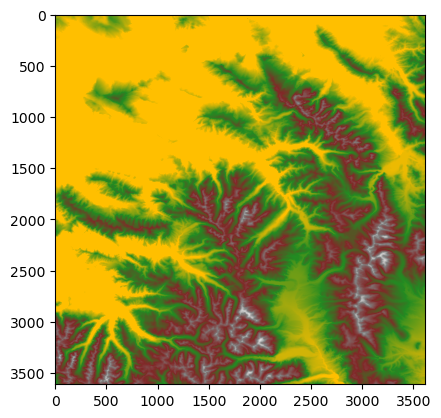

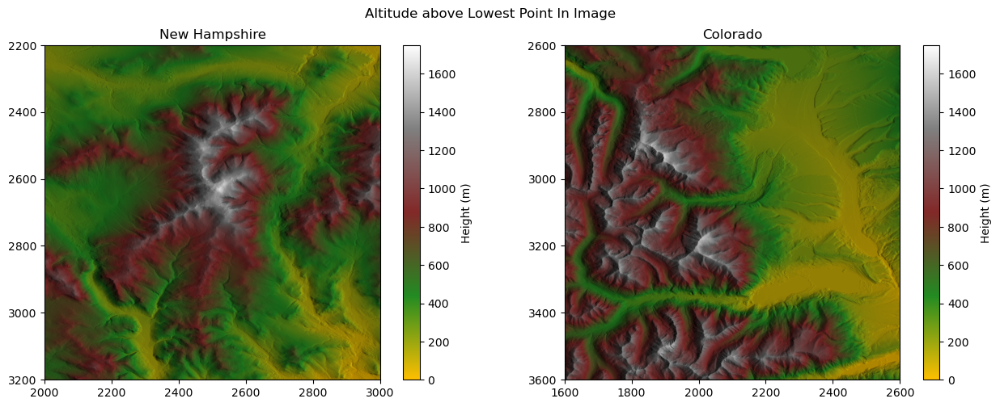

In [19]:
import matplotlib.pyplot as plt
import matplotlib as mpl

bounds_1 = (2000, 2000+1000, 3200, 3200-1000)
bounds_2 = (1600, 1600+1000, 3600, 3600-1000)
vmin_1, vmin_2, max_extent = get_limits(pix, pix2, bounds_1, bounds_2)

light_direction = [1,0,1]
shaded_NH = shade_image(pix, light_direction, vmin_1, max_extent, mtn_cmp)
shaded_CO = shade_image(pix2, light_direction, vmin_2, max_extent, mtn_cmp)


f, ax = plt.subplots(1,2, figsize=(13,5))
im=ax[0].imshow(shaded_NH)
ax[0].set_xlim(bounds_1[0], bounds_1[1])
ax[0].set_ylim(bounds_1[2], bounds_1[3])
ax[0].set_title("New Hampshire")
im2=ax[1].imshow(shaded_CO)
ax[1].set_xlim(bounds_2[0], bounds_2[1])
ax[1].set_ylim(bounds_2[2], bounds_2[3])
ax[1].set_title("Colorado")
plt.suptitle("Altitude above Lowest Point In Image")

# We have to add the colorbars in manually, since the image is now rgb values
norm = mpl.colors.Normalize(vmin=0, vmax=max_extent)
f.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(0, max_extent), cmap=mtn_cmp),
             ax=ax[0], orientation='vertical', label='Height (m)')
f.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(0, max_extent), cmap=mtn_cmp),
             ax=ax[1], orientation='vertical', label='Height (m)')

plt.tight_layout()
plt.savefig("NH_CO_mountains.png", dpi=300)

Compare the shaded images to the unshaded ones:

Text(0.5, 0.98, 'Altitude above Lowest Point In Image')

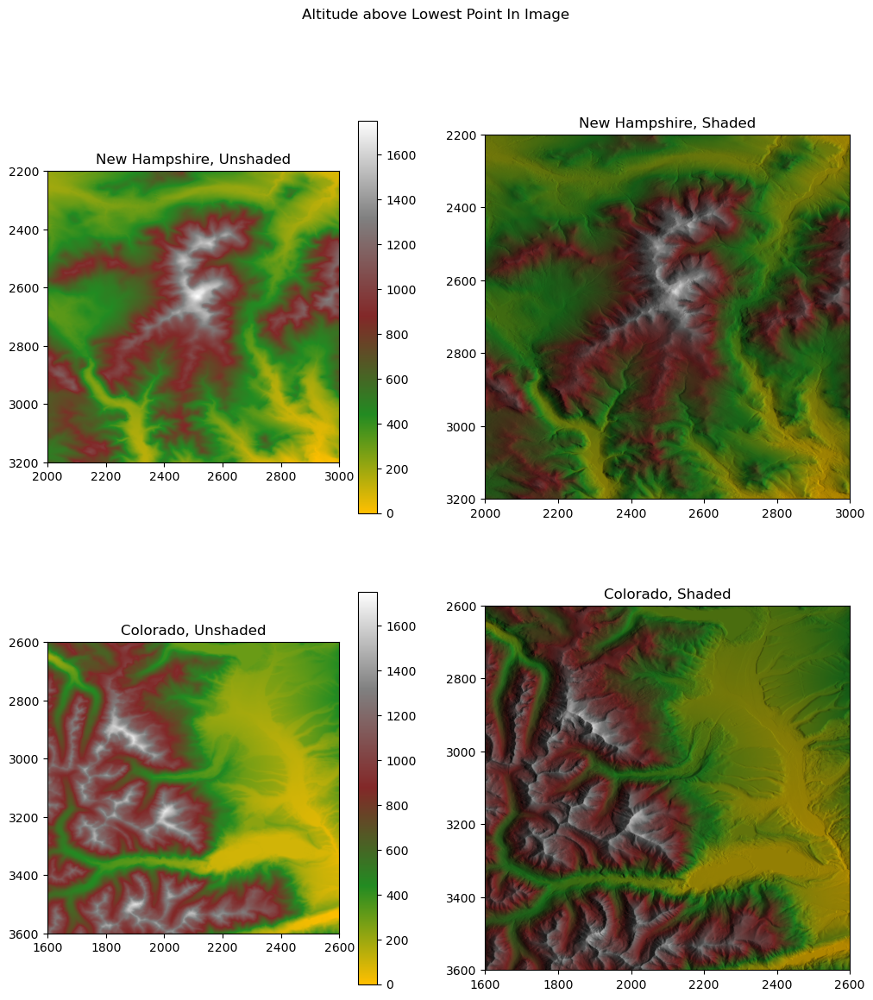

In [20]:
f, ax = plt.subplots(2,2, figsize=(12,13))
ax = ax.flatten()
# NH Plots
im=ax[0].imshow(pix-vmin_1, vmin=0, vmax=max_extent, cmap=mtn_cmp)
ax[0].set_xlim(bounds_1[0], bounds_1[1])
ax[0].set_ylim(bounds_1[2], bounds_1[3])
ax[0].set_title("New Hampshire, Unshaded")
f.colorbar(im)
im2=ax[1].imshow(shaded_NH)
ax[1].set_xlim(bounds_1[0], bounds_1[1])
ax[1].set_ylim(bounds_1[2], bounds_1[3])
ax[1].set_title("New Hampshire, Shaded")
# CO Plots
im3=ax[2].imshow(pix2-vmin_2, vmin=0, vmax=max_extent, cmap=mtn_cmp)
ax[2].set_xlim(bounds_2[0], bounds_2[1])
ax[2].set_ylim(bounds_2[2], bounds_2[3])
ax[2].set_title("Colorado, Unshaded")
f.colorbar(im3)
im4=ax[3].imshow(shaded_CO)
ax[3].set_xlim(bounds_2[0], bounds_2[1])
ax[3].set_ylim(bounds_2[2], bounds_2[3])
ax[3].set_title("Colorado, Shaded")
plt.suptitle("Altitude above Lowest Point In Image")

The shaded images are much easier to wrap our minds around, as they look like 3d objects even with such a simplistic shading method. 